### Topic 1: Structural Properties of LADs
# Similarities between cells

In [1]:
import numpy as np
import pandas as pd
import h5py
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm
from glob import glob
from scipy.signal import gaussian, fftconvolve
from matplotlib import gridspec
from scipy import signal
from scipy import stats

import sys
sys.path.append('../../combining_all_data/bin/')
sys.path.append('../bin/')
from preimplantation_toolkit import *
import preimplantation_load_data as ld

rs = np.random.RandomState()
rs.seed(42)

In [2]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

FIGOUTDIR = '../output/figures/1_Preimplantation.structural_properties_of_LADs.part2a.similarities_between_cells.homozygous/'

In [3]:
! mkdir -p $FIGOUTDIR || true;

In [4]:
HOME = '/Users/f.rang/surfdrive/Kind/data/'

BINSIZE = 100000
MINMAP_PER_KB = 1
MINMAP = int(MINMAP_PER_KB * BINSIZE / 1000)

ANNOFN = '../../combining_all_data/metadata/FR230814.samplesheet.tsv'
COLORFN = '../colors/manuscript_colors.tsv'

COUNTS = '../../combining_all_data/data/damid_counts/FR230814.DamID.sample_counts.{construct}.all_stages.{genotype}.damid_pass.binsize_{binsize:d}.hdf5'
BINARY = '../../combining_all_data/data/damid_binary/FR230814.DamID.sample_smooth_binary.{construct}.all_stages.{genotype}.damid_pass.binsize_{binsize:d}.hdf5'
CONTFC = '../../combining_all_data/data/damid_CF/FR230814.DamID.contact_frequency.{construct}.{stage}.{treatment}.{genotype}.damid_pass.binsize_{binsize:d}.hdf5'
INSILICO = '../../combining_all_data/data/damid_insilico/FR230814.DamID.insilico_counts.{construct}.{stage}.{treatment}.{genotype}.{sample}_samples.damid_pass.binsize_{binsize:d}.hdf5'

MAPFN = HOME + "references/mouse/mm10/mappability/Mus_musculus.GRCm38.dna.primary_assembly.with_ERCC.GATC.bowtie2_very_sensitive_N1.readlength_65.counts.pos.hdf5"
POSFN = HOME + "references/mouse/mm10/mappability/Mus_musculus.GRCm38.dna.primary_assembly.with_ERCC.GATC.posarray.hdf5"

# 1. Loading Kind data

In [5]:
color_dict = ld.load_color_dict(COLORFN)

## 1.1 Loading samplesheet

In [6]:
stage_order = ['zygote', '2cell', '8cell', 'mESC']
chrom_order = [str(c) for c in range(1,20)] + ['X', 'Y']

In [7]:
anno = pd.read_csv(ANNOFN, sep='\t', dtype={'number_embryos': str})

## select samples passing quality filters
anno = anno[anno.DamID_PASS]

## select conditions of interest
anno = anno[anno['construct'] == 'Lmnb1'].reset_index(drop=True)
anno = anno[anno['stage'].isin(stage_order)]
# anno = anno[anno['treatment'] == 'no_treatment']
anno = anno[anno.cellcount == 1]
anno = anno[anno.genotype.isin(['homozygous', '129S1/SvImJ_x_CAST/EiJ'])]

# setting stage order
anno['stage_order'] = anno['stage'].apply(func=lambda s: {stage: i for i, stage in enumerate(stage_order)}[s])
anno['stage'] = pd.Categorical(anno['stage'], categories=stage_order)
anno = anno.set_index(anno['damid_name'])

anno.head()

,runid,illumina_index,damid2_adapter_number,celseq2_adapter_number,cellcount,construct,fusion_construct,stage,treatment,genotype,...,nTranscripts,nTranscripts_maternal,nTranscripts_paternal,allelic_celseq_balance,nERCC,nMito,DamID_PASS,DamID_PASS_allelic,CELseq_PASS,stage_order
damid_name,,,,,,,,,,,,,,,,,,,,,
KIN1971.index03.DamID2_BC_001,KIN1971,3,1,0,1,Lmnb1,Dam-Lmnb1,2cell,no_treatment,homozygous,...,0,NaN,NaN,NaN,0,0,True,True,False,1
KIN1971.index03.DamID2_BC_009,KIN1971,3,9,0,1,Lmnb1,Dam-Lmnb1,2cell,no_treatment,homozygous,...,0,NaN,NaN,NaN,0,0,True,True,False,1
KIN1971.index03.DamID2_BC_017,KIN1971,3,17,0,1,Lmnb1,Dam-Lmnb1,2cell,no_treatment,homozygous,...,0,NaN,NaN,NaN,0,0,True,True,False,1
KIN1971.index03.DamID2_BC_025,KIN1971,3,25,0,1,Lmnb1,Dam-Lmnb1,2cell,no_treatment,homozygous,...,0,NaN,NaN,NaN,0,0,True,True,False,1
KIN1971.index03.DamID2_BC_033,KIN1971,3,33,0,1,Lmnb1,Dam-Lmnb1,2cell,no_treatment,homozygous,...,0,NaN,NaN,NaN,0,0,True,True,False,1


In [8]:
df=anno.groupby(['stage','treatment','genotype']).size()
df[df>0]

stage   treatment       genotype              
zygote  no_treatment    homozygous                107
2cell   Cbx7(CD)-Emd    homozygous                 17
        Cbx7(CD)-Lap2b  homozygous                 28
        Cbx7(CD)-Lbr    homozygous                 22
        Lap2b           homozygous                 31
        alpha-amanitin  homozygous                 14
        no_treatment    homozygous                197
8cell   no_treatment    homozygous                183
mESC    no_treatment    129S1/SvImJ_x_CAST/EiJ    268
dtype: int64

## 1.2 Loading mappability

In [9]:
mapab = ld.load_mappability(POSFN, MAPFN, chrom_order, BINSIZE)

## 1.3 Loading data

__DamID sample counts__

In [10]:
damid_counts = ld.load_sample_damid_counts(COUNTS, anno, BINSIZE, chrom_order)

Dam-Lmnb1 129S1/SvImJ_x_CAST/EiJ
Dam-Lmnb1 homozygous


__DamID sample binary signal__

In [11]:
damid_binary = ld.load_sample_damid_binary(BINARY, anno, BINSIZE, chrom_order)

Dam-Lmnb1 129S1/SvImJ_x_CAST/EiJ
Dam-Lmnb1 homozygous


__Contact Frequency__

In [12]:
contact_freq = dict()

for info, _ in anno.groupby(['fusion_construct', 'stage', 'genotype', 'is_heterozygous', 'treatment']):
    
    gt_name = info[2] if not info[3] else info[2].replace('/','') + '.combined'
    fn = CONTFC.format(construct = info[0], stage = info[1], treatment = info[4], genotype = gt_name, binsize=BINSIZE)
    
    assert len(anno[anno.stage==info[1]].genotype.unique()) == 1
    assert len(anno.fusion_construct.unique()) == 1
    contact_freq[(info[1], info[4])] =  load_count_file(fn)

__In silico populations__

In [13]:
from collections import defaultdict

In [14]:
insilico_pops = defaultdict(dict)
mapab_rpkm = rpkm_normalize(mapab, binsize=BINSIZE)
PC = 0.1

for info, _ in anno.groupby(['fusion_construct', 'stage', 'genotype', 'is_heterozygous', 'treatment']):

    gt_name = info[2] if not info[3] else info[2].replace('/','') + '.combined'
    fn = INSILICO.format(construct = info[0], stage = info[1], treatment = info[4], genotype = gt_name, sample = '1cell', binsize=BINSIZE)
    
    
    assert len(anno[anno.stage==info[1]].genotype.unique()) == 1
    assert len(anno.fusion_construct.unique()) == 1
    assert len(anno.cellcount.unique()) == 1
    
    counts = load_count_file(fn)
    insilico_pops['raw'][(info[1], info[4])] = counts
    rpkm = rpkm_normalize(counts, binsize=BINSIZE)
    insilico_pops['rpkm'][(info[1], info[4])] = rpkm
    insilico_pops['log2oe'][(info[1], info[4])] = {c: np.log2( (rpkm[c] + PC) / (mapab_rpkm[c] + PC) ) for c in chrom_order}

# 3. Cell-to-cell variability through the scope of CF distributions
Sets of samples with higher cell-to-cell variability should also have more intermediate CF values

## 3.1 Computing CF of original and simulated data per condition

In [15]:
chrom_select = np.array(chrom_order[:-2])
m_ind = np.concatenate([mapab[c] for c in chrom_select]) > MINMAP

to_plot = list()

for info, df in anno.groupby(['stage', 'treatment']):
    
    samples = df.index.values
    if len(samples) < 25:
        continue
    
    # compute CF values
    M = list()
    for sample in samples:
        y = np.concatenate([damid_binary[sample][c] for c in chrom_select])
        M.append(y)
    M = np.array(M)
    cf = M.mean(axis=0)[m_ind]
    n = len(cf)

    out = pd.DataFrame({
        'stage': np.repeat(info[0],n), 'treatment': np.repeat(info[1],n), 'cf': cf
    })
    to_plot.append(out)
        
to_plot = pd.concat(to_plot, axis=0)
to_plot['label'] = to_plot.apply(axis=1, func = lambda r: '%s\n%s' % (r['stage'], r['treatment']))


## 3.2 Original CF distributions

/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_5391/2142349348.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), ha='right', rotation=45)


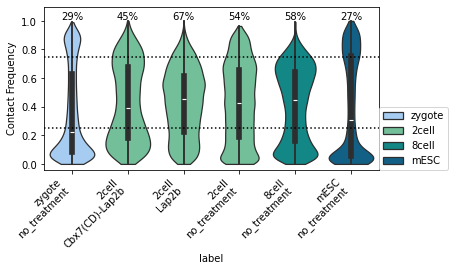

In [16]:
T1 = 0.25
T2 = 0.75

order = to_plot['label'].unique()

fig, ax = plt.subplots(1,1, figsize=(len(order),3))

sns.violinplot(
    x=to_plot['label'], y=to_plot['cf'], hue=to_plot['stage'], dodge = False,
    order=order, palette=color_dict['stage'], ax=ax, cut=0
)

ax.set_xticklabels(ax.get_xticklabels(), ha='right', rotation=45)
ax.legend(loc=(1,0))
ax.axhline(T1, c='k', ls=':')
ax.axhline(T2, c='k', ls=':')
ax.set_ylabel('Contact Frequency')
ax.set_ylim(-.04, 1.1)

for x, lab in enumerate(order):
    df_a = to_plot[(to_plot['label']==lab)]
    
    a = ((df_a.cf > T1) & (df_a.cf < T2)).mean() * 100
    
    t = '{:.0f}%'.format(a)
    ax.text(x, 1, t, ha='center', va='bottom')
    
outfn = FIGOUTDIR + 'contact_frequency_distribution.as_measure_of_variability.all_conditions.pdf'
plt.savefig(outfn)

In [19]:
to_plot

,stage,treatment,cf,label
0,zygote,no_treatment,0.186916,zygote\nno_treatment
1,zygote,no_treatment,0.271028,zygote\nno_treatment
2,zygote,no_treatment,0.317757,zygote\nno_treatment
3,zygote,no_treatment,0.420561,zygote\nno_treatment
4,zygote,no_treatment,0.448598,zygote\nno_treatment
...,...,...,...,...
23746,mESC,no_treatment,0.190299,mESC\nno_treatment
23747,mESC,no_treatment,0.212687,mESC\nno_treatment
23748,mESC,no_treatment,0.190299,mESC\nno_treatment
23749,mESC,no_treatment,0.182836,mESC\nno_treatment


stage   treatment   
2cell   no_treatment    23751
8cell   no_treatment    23751
mESC    no_treatment    23751
zygote  no_treatment    23751
dtype: int64


/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_5391/2621382080.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_5391/2621382080.py:12: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), ha='right', rotation=45)


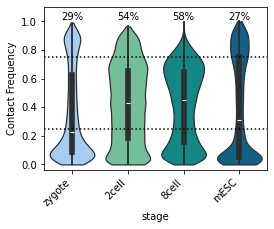

In [21]:
fig, ax = plt.subplots(1,1, figsize=(4,3))

order = to_plot['stage'].unique()
ind = (to_plot.treatment == 'no_treatment')
print(to_plot[ind].groupby(['stage', 'treatment']).size())

sns.violinplot(
    x=to_plot.loc[ind,'stage'], y=to_plot.loc[ind,'cf'],
    order=order, palette=color_dict['stage'], ax=ax, cut=0
)

ax.set_xticklabels(ax.get_xticklabels(), ha='right', rotation=45)
ax.axhline(0.25, c='k', ls=':')
ax.axhline(0.75, c='k', ls=':')
ax.set_ylabel('Contact Frequency')
ax.set_ylim(-.04, 1.1)

for x, lab in enumerate(order):
    df_a = to_plot[(to_plot['stage']==lab) & ind]
    
    a = ((df_a.cf > 0.25) & (df_a.cf < 0.75)).mean() * 100
    
    t = '{:.0f}%'.format(a)
    ax.text(x, 1, t, ha='center', va='bottom')
    
outfn = FIGOUTDIR + 'contact_frequency_distribution.as_measure_of_variability.untreated_samples.pdf'
plt.savefig(outfn)

# 4. Cell-to-cell variability through Shannon Entropy on CF distributions

In [18]:
def compute_shannon_entropy(cf_vals):
    
    p_1 = cf_vals
    p_0 = (1 - cf_vals)
    
    outcome_1 = - p_1 * np.log(p_1)
    outcome_0 = - p_0 * np.log(p_0)
    
    return outcome_1 + outcome_0

In [19]:
condition = ('2cell', 'no_treatment')
to_plot = dict()

for condition, df in anno.groupby(['stage', 'treatment']):
    
    samples = df.index.values
    if len(samples) < 20:
        continue
    
    
    m_ind = np.concatenate([mapab[c] for c in chrom_order[:-2]]) > MINMAP
    cf_vals = np.concatenate([contact_freq[condition][c] for c in chrom_order[:-2]])
    se = compute_shannon_entropy(cf_vals[m_ind])
    to_plot[condition] = se
    
to_plot = pd.DataFrame(to_plot)
to_plot['index'] = to_plot.index.values
to_plot = to_plot.melt(id_vars=['index'])
to_plot.columns = ['index', 'stage', 'treatment', 'entropy']
to_plot['label'] = to_plot.apply(axis=1, func = lambda r: '%s\n%s' % (r['stage'], r['treatment']))
to_plot['entropy'] = to_plot['entropy'].fillna(0)

/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_13814/1923013673.py:6: RuntimeWarning: divide by zero encountered in log
  outcome_1 = - p_1 * np.log(p_1)
/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_13814/1923013673.py:6: RuntimeWarning: invalid value encountered in multiply
  outcome_1 = - p_1 * np.log(p_1)
/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_13814/1923013673.py:7: RuntimeWarning: divide by zero encountered in log
  outcome_0 = - p_0 * np.log(p_0)
/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_13814/1923013673.py:7: RuntimeWarning: invalid value encountered in multiply
  outcome_0 = - p_0 * np.log(p_0)


In [20]:
max_entropy = (-0.5*np.log(0.5))*2

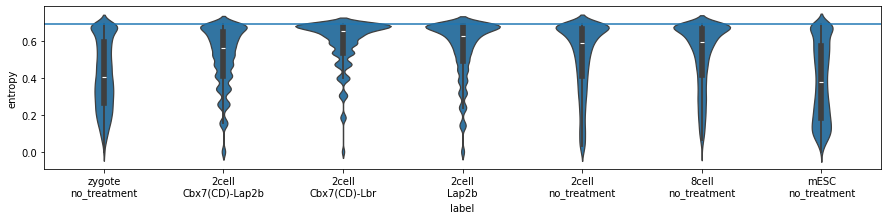

In [21]:
fig, ax = plt.subplots(figsize=(15,3))


sns.violinplot(x=to_plot['label'], y=to_plot['entropy'])
# sns.boxplot(x=to_plot['label'], y=to_plot['entropy'], hue=to_plot['dataset'])
ax.axhline(max_entropy)

# 3. Cell-cell correlations in specific subsets of regions

## 3.1 Load different genome segmentations

#### cLADs, ciLADs, fLADs/fiLADs based on Peric-Hupkes

In [22]:
# load LAD calls
FN = '../../GSE17051/data/SaraPerricone_Peric-Hupkes2010.HMM_state_aver_repl_100kb_bins.mm10.txt'
perichupkes = pd.read_table(FN)
perichupkes.columns = ['chrom', 'start', 'end', 'AC', 'ESC', 'MEF', 'NPC']
for col in ['AC', 'ESC', 'MEF', 'NPC']:
    perichupkes.loc[perichupkes[col].str.contains('NA'), col] = np.nan
    perichupkes[col] = perichupkes[col].astype(float)
perichupkes['chrom'] = perichupkes['chrom'].apply(func = lambda c: c.strip('chr'))
perichupkes = perichupkes[perichupkes.chrom.isin(chrom_order)]

# determine cLAD/ciLAD/fLAD
perichupkes['is_valid'] = perichupkes.isna().sum(axis=1) == 0
perichupkes.loc[~perichupkes.is_valid, 'LAD_type'] = 'invalid'
perichupkes.loc[perichupkes.is_valid, 'LAD_type'] = 'fLAD/fiLAD'
ind = perichupkes[['AC', 'ESC', 'MEF', 'NPC']].sum(axis=1) == 4
perichupkes.loc[ind, 'LAD_type'] = 'cLAD'
ind = (perichupkes[['AC', 'ESC', 'MEF', 'NPC']].sum(axis=1) == 0) & (perichupkes.is_valid)
perichupkes.loc[ind, 'LAD_type'] = 'ciLAD'

In [23]:
lad_type_ph = dict()

for chrom, df in perichupkes.groupby('chrom'):
    assert(all(df.end.values[:-1] == df.start.values[1:]))
    assert len(df) >= len(mapab[chrom])
    
    l = df['LAD_type'].values
    lad_type_ph[chrom] = l[:len(mapab[chrom])]

#### cLAD, ciLAD and fLAD/fiLAD based on preimplantation data

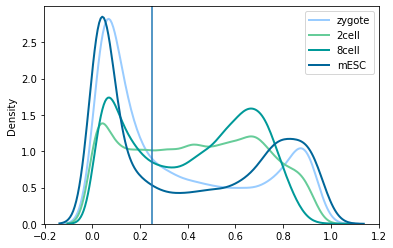

In [24]:
fig, ax = plt.subplots()
m_ind = np.concatenate([mapab[c] for c in chrom_order[:-2]]) > MINMAP
for stage in stage_order:
    x = np.concatenate([contact_freq[(stage,'no_treatment')][c] for c in chrom_order[:-2]])[m_ind]
    sns.kdeplot(x, label=stage, color=color_dict['stage'][stage], lw=2)
ax.axvline(.25)
ax.legend()

In [25]:
lad_type_emb = dict()
tmp = {i: 'fLAD/fiLAD' for i in range(len(stage_order))}
tmp[0] = 'ciLAD'
tmp[len(stage_order)] = 'cLAD'

for c in chrom_order:
    L = np.array([contact_freq[(stage,'no_treatment')][c] > 0.25 for stage in stage_order])
    L = L.sum(axis=0)
    
    lad_type_emb[c] = np.array([tmp[n] for n in L])
    
lad_type_emb_lin = np.concatenate([lad_type_emb[c] for c in chrom_order[:-2]])
for t in np.unique(lad_type_emb_lin):
    print(t, (lad_type_emb_lin[m_ind]==t).sum())

cLAD 9669
ciLAD 6064
fLAD/fiLAD 8018


#### H3K27me3 presence at the 2-cell stage

In [26]:
FN = '../../combining_all_external_data/metadata/external_data_combined_samples.tsv'
ext_anno = pd.read_table(FN)
ext_anno = ext_anno[ext_anno.treatment == 'no']

samples = ext_anno.loc[ext_anno.target.isin(['H3K27me3']), 'sample_id'].values
controls = ext_anno.loc[ext_anno.sample_id.isin(samples) & (ext_anno.control_id != 'none'), 'control_id'].values
samples = np.concatenate([samples, controls])
ext_anno = ext_anno[ext_anno.sample_id.isin(samples)]
ext_anno = ext_anno[~((ext_anno.dataset_id == 'GSE71434') & (ext_anno.target == 'H3K27me3'))]

select_stages = [
    'PN3_zygote', 'PN5_zygote', 
    '2cell_early', '2cell', '2cell_late',
    '8cell', 'mESC'
]
ext_anno = ext_anno[ext_anno.stage.isin(select_stages)]

ext_anno['stage'] = pd.Categorical(ext_anno['stage'], select_stages)

FNFMT = {
    'combined': '../../combining_all_external_data/data/binned/FR230828.external_data.RPKM.binsize_%d.tsv.gz',
    'maternal': '../../combining_all_external_data/data/binned/FR230828.external_data.allelic.unique_maternal.RPKM.binsize_%d.tsv.gz',
    'paternal': '../../combining_all_external_data/data/binned/FR230828.external_data.allelic.unique_paternal.RPKM.binsize_%d.tsv.gz',
    'allele_vis': '../../combining_all_external_data/data/binned/FR230828.external_data.allelic.allele_vis.fraction.binsize_%d.tsv.gz'
}

In [27]:
ext_data = {p: dict() for p in ['combined', 'maternal', 'paternal', 'allele_vis']}

for dat, fnfmt in FNFMT.items():
    fn = fnfmt % BINSIZE
    df = pd.read_table(fn, dtype={'chrom': str})
    
    for sample in ext_anno.sample_id.values:
        if sample not in df.columns:
            continue
            
        bed = df[['chrom', 'start', 'end', sample]].copy().rename(columns={sample: 'reads'})
        data = convert_bedgraph_to_hdf5dict(bed, binsize=BINSIZE)
        ext_data[dat][sample] = {c: data[c][:len(mapab[c])] for c in chrom_order}
        
    if dat == 'combined':
        bed = df[['chrom', 'start', 'end', 'blacklisted']].copy().rename(columns={'blacklisted': 'reads'})
        data = convert_bedgraph_to_hdf5dict(bed, binsize=BINSIZE)
        ext_data['blacklisted'] = {c: data[c][:len(mapab[c])] for c in chrom_order}

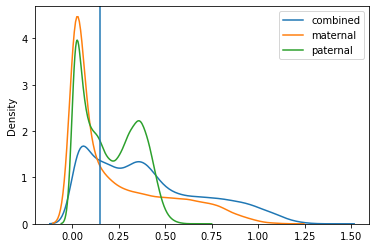

In [28]:
ext_sample = 'GSE76687_008'

fig, ax = plt.subplots()

vis_ind = np.concatenate([ext_data['allele_vis'][ext_sample][c] for c in chrom_order]) > .4
for parent in ['combined', 'maternal', 'paternal']:
    x = np.concatenate([ext_data[parent][ext_sample][c] for c in chrom_order])[vis_ind]
    sns.kdeplot(x.clip(0,1.5), label=parent)
ax.legend()
ax.axvline(.15)

In [29]:
a = np.concatenate([ext_data['maternal'][ext_sample][c] for c in chrom_order])[vis_ind] > .2
b = np.concatenate([ext_data['paternal'][ext_sample][c] for c in chrom_order])[vis_ind] > .2
c = np.concatenate([ext_data['combined'][ext_sample][c] for c in chrom_order])[vis_ind] > .2

print(a.sum())
print(b.sum())
print((a&b).sum(), (a&b).mean())
print((a|b).sum())
print(((a|b) & c).sum())
print(c.sum())

8736
10545
5610 0.2538576406172225
13671
13576
14908


In [30]:
k27_presence = dict()
for c in chrom_order:
    M = ext_data['maternal'][ext_sample][c]
    P = ext_data['paternal'][ext_sample][c]
    C = ext_data['combined'][ext_sample][c]
    f = ext_data['allele_vis'][ext_sample][c] > 0.1
    
    presence = pd.Series(np.repeat('absent', len(C)))
#     presence[(M < 0.2) & (P > 0.2)] = 'paternal specific'
#     presence[(M > 0.2) & (P < 0.2)] = 'maternal specific'
#     presence[(M > 0.2) & (P > 0.2)] = 'both alleles'
    
    presence[(C > 0.15)] = 'maternal|paternal'
    
    
#     presence[~f] = 'invalid'
    
    k27_presence[c] = presence

#### Combine different segmentations

In [31]:
genome_segmentations = {
    'LAD_type_PericHupkes': lad_type_ph,
    'LAD_type_embryonic': lad_type_emb,
    'H3K27me3_2cell': k27_presence
}

## 3.2 Inspect CF distributions per category

In [32]:
m_ind = np.concatenate([mapab[c] for c in chrom_order[:-2]]) > MINMAP
n = m_ind.sum()

plot_dict = dict()

for seg in genome_segmentations.keys():
    
    seg_lin = np.concatenate([genome_segmentations[seg][c] for c in chrom_order[:-2]])[m_ind]
    
    # generate dataframe for plotting
    to_plot = list()
    
    
    for condition in contact_freq.keys():

        X = np.concatenate([contact_freq[condition][c] for c in chrom_order[:-2]])[m_ind]
        s = np.repeat(condition[0], n)
        t = np.repeat(condition[1], n)
        l = np.repeat('%s\n%s' % condition, n)
        df = pd.DataFrame({'stage': s, 'treatment': t, 'label': l, 'CF': X, 'regions': np.repeat('all',n)})
        to_plot.append(df)
        df = pd.DataFrame({'stage': s, 'treatment': t, 'label': l, 'CF': X, 'regions': seg_lin})
        to_plot.append(df)
        
    to_plot = pd.concat(to_plot, axis=0)
    to_plot = to_plot[to_plot['regions'] != 'invalid'].reset_index(drop=True)
    plot_dict[seg] = to_plot


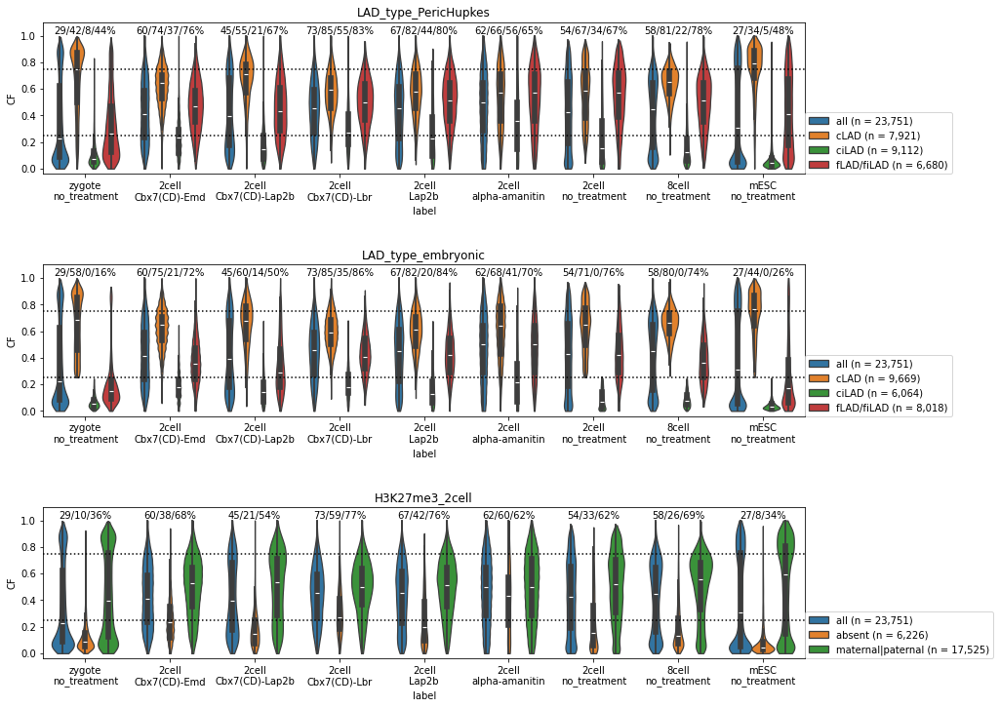

In [33]:
nrow = len(genome_segmentations)
fig, axes = plt.subplots(nrow, 1, figsize=(14, nrow*4))
plt.subplots_adjust(hspace=.6, wspace=.4)

for irow, seg in enumerate(genome_segmentations.keys()):
    to_plot = plot_dict[seg].copy()
    order = to_plot['label'].unique()
    ho = to_plot['regions'].sort_values().unique()
    ho = ho[ho!='all']
    ho = ['all'] + list(ho)
    
    ax = axes[irow]
    ax.set_title(seg)
    
    sns.violinplot(
        x = to_plot['label'], y = to_plot['CF'], hue = to_plot['regions'],
        hue_order = ho, order = order,
        ax = ax, cut = 0
    )
    ax.axhline(0.25, c='k', ls=':')
    ax.axhline(0.75, c='k', ls=':')
#     ax.legend(loc=(1,0))
    
    for x, lab in enumerate(order):
        
        t = list()
        
        for cat in ho:
            
            tmp = to_plot[(to_plot['label'] == lab) & (to_plot['regions'] == cat)]
            a = ((tmp.CF > 0.25) & (tmp.CF < 0.75)).mean() * 100
            t.append('%.0f' % a)
        t = '/'.join(t) + '%'
        ax.text(x, 1, t, va='bottom', ha='center')
        
    ax.set_ylim(-0.04, 1.1)
    
    labname = list()
    for cat in ho:
        ind = (to_plot['label']==order[0]) & (to_plot['regions']==cat)
        labname.append('{} (n = {:,d})'.format(cat, ind.sum()))
    
    handles, _ = ax.get_legend_handles_labels()
    ax.legend(handles=handles, labels=labname, loc=(1,0))
    
outfn = FIGOUTDIR + 'contact_frequency_distribution.different_genomic_regions.all_conditions.pdf'
plt.savefig(outfn)

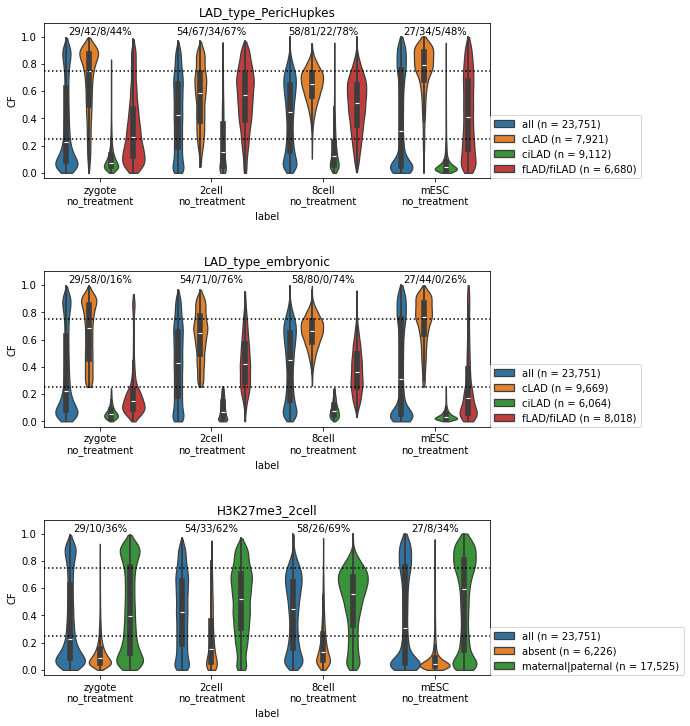

In [34]:
nrow = len(genome_segmentations)
fig, axes = plt.subplots(nrow, 1, figsize=(8, nrow*4))
plt.subplots_adjust(hspace=.6, wspace=.4)

for irow, seg in enumerate(genome_segmentations.keys()):
    to_plot = plot_dict[seg].copy()
    to_plot = to_plot[to_plot.treatment == 'no_treatment']
    order = to_plot['label'].unique()
    ho = to_plot['regions'].sort_values().unique()
    ho = ho[ho!='all']
    ho = ['all'] + list(ho)
    
    ax = axes[irow]
    ax.set_title(seg)
    
    sns.violinplot(
        x = to_plot['label'], y = to_plot['CF'], hue = to_plot['regions'],
        hue_order = ho, order = order,
        ax = ax, cut = 0
    )
    ax.axhline(0.25, c='k', ls=':')
    ax.axhline(0.75, c='k', ls=':')
#     ax.legend(loc=(1,0))
    
    for x, lab in enumerate(order):
        
        t = list()
        
        for cat in ho:
            
            tmp = to_plot[(to_plot['label'] == lab) & (to_plot['regions'] == cat)]
            a = ((tmp.CF > 0.25) & (tmp.CF < 0.75)).mean() * 100
            t.append('%.0f' % a)
        t = '/'.join(t) + '%'
        ax.text(x, 1, t, va='bottom', ha='center')
        
    ax.set_ylim(-0.04, 1.1)
    
    labname = list()
    for cat in ho:
        ind = (to_plot['label']==order[0]) & (to_plot['regions']==cat)
        labname.append('{} (n = {:,d})'.format(cat, ind.sum()))
    
    handles, _ = ax.get_legend_handles_labels()
    ax.legend(handles=handles, labels=labname, loc=(1,0))
    
outfn = FIGOUTDIR + 'contact_frequency_distribution.different_genomic_regions.untreated_stages.pdf'
plt.savefig(outfn)

# Question 2: Is it possible to identify sister cells in 8-cell embryos based on a greater similarity in their Dam-LaminB1 DamID profile?

In [35]:
import scipy.spatial as sp, scipy.cluster.hierarchy as hc

In [36]:
from sklearn.metrics import pairwise_distances

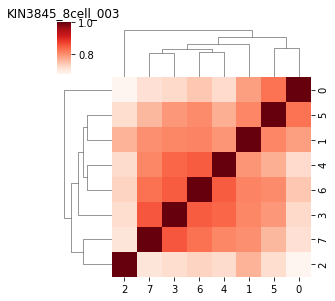

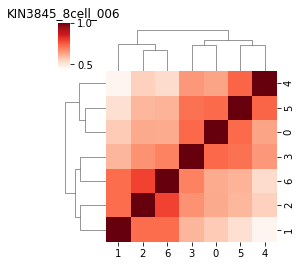

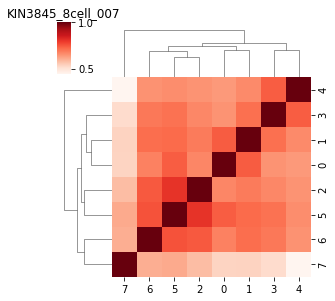

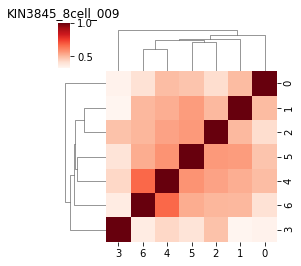

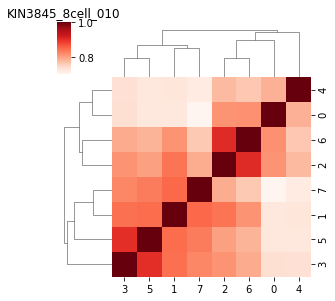

...

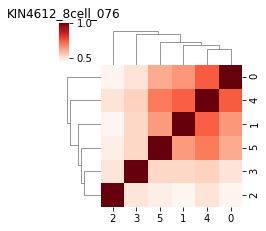

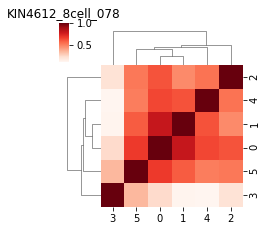

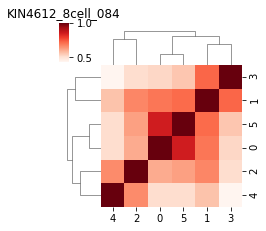

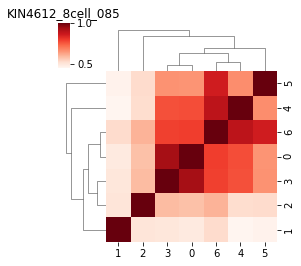

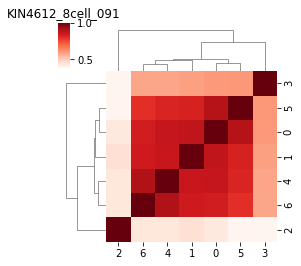

In [37]:
tmp = anno[(anno.stage == '8cell') & (anno.treatment=='no_treatment') & (anno.cellcount == 1)].groupby('embryo_id').size()
embryos_of_interest = tmp[tmp >= 6].index

m_ind = np.concatenate([mapab[c] for c in chrom_order[:-2]]) > MINMAP

for eid, df in anno[anno['embryo_id'].isin(embryos_of_interest)].groupby('embryo_id'):
    samples = df.index.values
    
    data = list()
    for s in samples:
        y = np.concatenate([damid_binary[s][c] for c in chrom_order[:-2]])[m_ind]
        data.append(y)
    data = np.array(data)
    
    df_dist = pairwise_distances(data.astype(bool), metric='yule')
    df_dist = pd.DataFrame(df_dist, columns=samples, index=samples)
    df_corr = 1 - df_dist
    linkage = hc.linkage(sp.distance.squareform(df_dist), method='average', optimal_ordering=True)
    
    n = len(df)
    tmp = {s: i for i, s in enumerate(df_corr.columns.values)}
    df_corr = df_corr.rename(columns=tmp, index=tmp)
    grid = sns.clustermap(df_corr, 
                   row_linkage=linkage, 
                   col_linkage=linkage, 
                   figsize=(n/2,n/2), 
                   cmap='Reds')
    grid.ax_heatmap.set_aspect('equal')
    grid.ax_heatmap.set_ylim(0, len(df))
    grid.ax_heatmap.set_xlim(0, len(df))
    plt.title(eid)

Based on these correlation clustermaps, it does not seem trivial to assign sister cells. However, there are some embryos where a "phylogenetic tree" does seem apparent. Perhaps in conjunction with transcription data this will be possible?

## Question 3: Are there cells with similar NL-association profiles?

### Correlation matrix of embryos (excl. mESC)

In [38]:
stages_of_interest = ['zygote', '2cell', '8cell']

In [39]:
samples = anno[(anno.stage.isin(stages_of_interest)) & (anno.cellcount==1) & (anno.treatment=='no_treatment')].index.values
chroms = chrom_order[:-2]

# select data
m_ind = np.concatenate([mapab[c] for c in chroms]) > MINMAP
data = list()
for s in samples:
    y = np.concatenate([damid_binary[s][c] for c in chroms])[m_ind]
    data.append(y)
data = np.array(data)

In [40]:
DF_dism_embryo = pairwise_distances(data.astype(bool), metric='yule')
DF_corr_embryo = 1 - DF_dism_embryo

In [41]:
linkage = hc.linkage((DF_dism_embryo), method='average', optimal_ordering=True)

/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_13814/3676745715.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hc.linkage((DF_dism_embryo), method='average', optimal_ordering=True)


In [42]:
cols = anno.loc[samples, ['stage', 'technique', 'runid', 'IC_mappability', 'unique_damid_counts']].copy()
tmp = {s: i for i, s in enumerate(stages_of_interest)}
cols['color_stage'] = [tmp[s] for s in cols['stage']]
set_runids = sorted(list(set(cols.runid)))
tmp = {s: i for i, s in enumerate(set_runids)}
cols['color_runid'] = [tmp[s] for s in cols['runid']]

In [43]:
sample_order = hc.leaves_list(linkage)

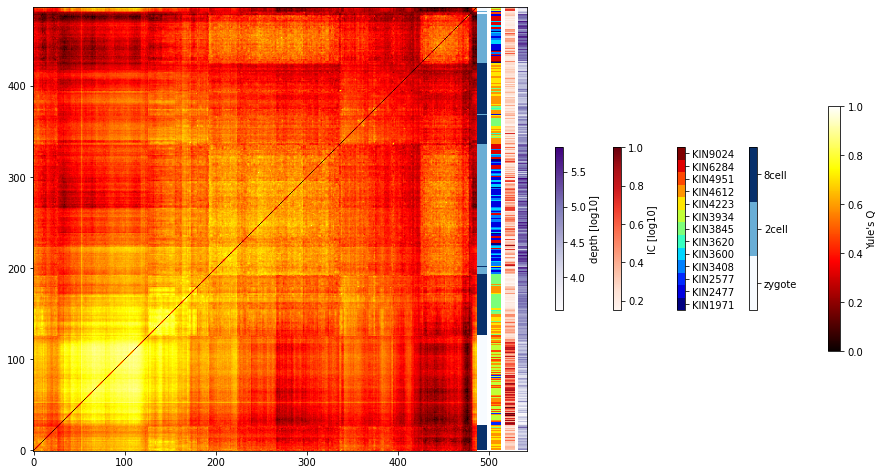

In [44]:
fig, ax = plt.subplots(figsize=(15,15))

to_plot = np.array(DF_corr_embryo)
to_plot[np.diag_indices(len(to_plot))] = 0

p = ax.imshow(to_plot[sample_order,:][:,sample_order], cmap='hot', vmin=0, vmax=1, origin='lower', aspect='auto')
cbar1 = plt.colorbar(p, ax=ax, shrink=.3, fraction=0.05)
cbar1.ax.set_ylabel('Yule\'s Q')

c2 = ax.pcolorfast([len(to_plot),len(to_plot)+10], [0, len(to_plot)], np.atleast_2d(cols['color_stage'][sample_order]).T, cmap='Blues')
cbar2 = plt.colorbar(c2, ax=ax, 
                     boundaries=range(len(stages_of_interest)+1), 
                     values=range(len(stages_of_interest)), 
                     ticks=np.arange(len(stages_of_interest)) + 0.5,
                     shrink=.2, fraction=0.05)
cbar2.ax.set_yticklabels(stage_order[:-1])

c3 = ax.pcolorfast([len(to_plot)+15,len(to_plot)+25], [0, len(to_plot)], np.atleast_2d(cols['color_runid'][sample_order]).T, cmap='jet')
cbar3 = plt.colorbar(c3, ax=ax, 
                     boundaries=range(len(set_runids)+1), 
                     values=range(len(set_runids)), 
                     ticks=np.arange(len(set_runids)) + 0.5,
                     shrink=.2, fraction=0.05)
cbar3.ax.set_yticklabels(set_runids)

ic = np.atleast_2d(np.log10(cols['IC_mappability'][sample_order].values)).T
c4 = ax.pcolorfast([len(to_plot)+30,len(to_plot)+40], [0, len(to_plot)], ic, cmap='Reds')
cbar4 = plt.colorbar(c4, ax=ax, shrink=0.2, fraction=0.05)
cbar4.ax.set_ylabel('IC [log10]')

ic = np.atleast_2d(np.log10(cols['unique_damid_counts'][sample_order].values)).T
c4 = ax.pcolorfast([len(to_plot)+45,len(to_plot)+55], [0, len(to_plot)], ic, cmap='Purples')
cbar4 = plt.colorbar(c4, ax=ax, shrink=0.2, fraction=0.05)
cbar4.ax.set_ylabel('depth [log10]')




ax.grid(False)
ax.set_aspect('equal')

Interestingly, the split in 8-cell samples does not appear to be obviously due to a particular run or to a big difference in IC. 

### Binary contact maps - sample order determined by hierarchical clustering

In [45]:
chrom_lens = np.array([len(mapab[c]) for c in chrom_order])
chrom_seps = chrom_lens.cumsum()
chrom_ticks = chrom_seps - 0.5*chrom_lens

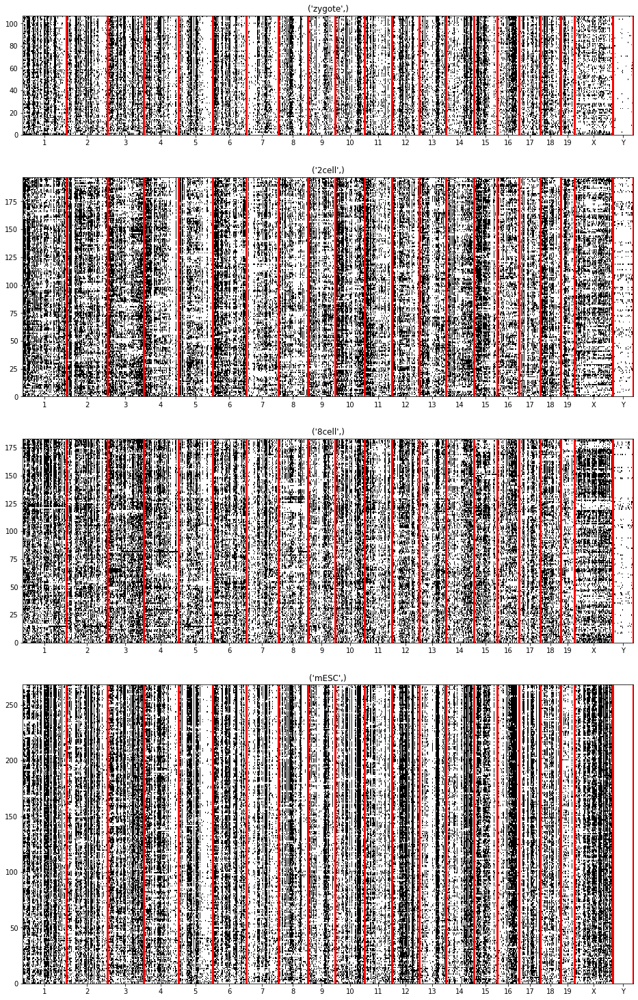

In [46]:
g = anno[(anno.cellcount == 1) & (anno.treatment == 'no_treatment')].groupby(['stage'])
nrow = len(list(g))
ncol = 1
hr = [len(df) for _, df in g]
fig = plt.figure(figsize=(16, len(anno)*0.03)) 
gs = gridspec.GridSpec(nrow, ncol, height_ratios=hr, hspace=0.2)
counter = 0

# define valid bins
# unmappable bins are discarded
# chrX and chrY are discarded, since the embryos are mixed male and female
m_ind = np.concatenate([mapab[c] for c in chrom_order[:-2]]) > MINMAP

for stage, df in g:
    samples = df.index.values
    Y_clus = list()
    Y_view = list()
    for s in samples:
        y = np.concatenate([damid_binary[s][c] for c in chrom_order[:-2]])
        Y_clus.append(y)
        y = np.concatenate([damid_binary[s][c] for c in chrom_order])
        Y_view.append(y)
    Y_clus = np.array(Y_clus)
    Y_view = np.array(Y_view)
    
    ax = plt.subplot(gs[counter])
    counter += 1
    
    # calculate correlations
    data = Y_clus[:,m_ind]
    df_dism = pairwise_distances(data.astype(bool), metric='yule')
    df_corr = 1 - df_dism
    
    # compute optimal sample ordering
    linkage = hc.linkage(sp.distance.squareform(df_dism), method='average')
    sample_order = hc.leaves_list(linkage)
    
    ax.pcolorfast(Y_view[sample_order,:], cmap='binary')
    ax.grid(False)
    ax.set_title(stage)
    for x in chrom_seps:
        ax.axvline(x, c='r', lw=3)
    ax.set_xticks(chrom_ticks)
    ax.set_xticklabels(chrom_order)

There are no clear groups of cells that behave similaryl across chromosomes for any of the stages. However, for both the 2-cell and 8-cell stage, the cells at the bottom of the plot seem to have a lower quality. Within each chromosome, there do to be small groups of cells that have considerably less contacts.

## Question 4: Are there cells that have similar NL-association profiles on particular chromosomes?

### Hierarchical clustering of 2-cell chromosomal correlations and corresponding heatmaps

In [47]:
def plot_clustered_heatmaps_per_chrom(valid_samples, chroms, titlefmt = 'samples', metric='yule'):
    nrow = len(chroms)
    ncol = 25
    fig = plt.figure(figsize=(16, nrow*4)) 
    gs = gridspec.GridSpec(nrow, ncol, hspace=0.2)

    for irow, chrom in enumerate(chroms):

        data = np.array([damid_binary[s][chrom] for s in valid_samples])
        m_ind = mapab[chrom] > MINMAP

        df_dism = pairwise_distances(data[:,m_ind].astype(bool), metric=metric)
        df_corr = 1 - df_dism
        linkage = hc.linkage(sp.distance.squareform(df_dism), method='average', optimal_ordering=True)
        sample_order = hc.leaves_list(linkage)

        to_plot = np.array(df_corr)
        to_plot[np.diag_indices(len(to_plot))] = 0

        ax = plt.subplot(gs[irow,:8])

        p = ax.pcolorfast(to_plot[sample_order,:][:,sample_order], cmap='coolwarm', vmin=-1, vmax=1)
        cbar = plt.colorbar(p, ax=ax, shrink=.5)
        cbar.ax.set_ylabel(metric)

        ax.set_title('chr{}'.format(chrom))
        ax.set_aspect('equal')
        ax.grid(False)

        ## plot heatmaps
        l = int(np.ceil(chrom_lens[irow] / max(chrom_lens) * 16)) + 9
        ax = plt.subplot(gs[irow, 9:l])

        ax.pcolorfast(data[sample_order,:], cmap='binary')
        ax.grid(False)
        ax.set_title('%s - chr%s' % (titlefmt, chrom))
        xticks = np.arange(0, data.shape[1], int(1e7/BINSIZE))
        xlabs = np.arange(0, data.shape[1]*BINSIZE, int(1e7)) / 1e6
        ax.set_xticks(xticks)
        ax.set_xticklabels(xlabs.astype(int))
        
    plt.show()
    plt.close()

### zygote samples

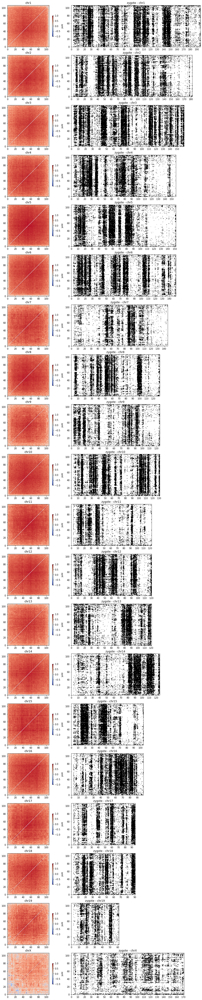

In [48]:
valid_samples = anno[(anno.cellcount == 1) & (anno.stage.isin(['zygote'])) & (anno.treatment=='no_treatment')].index.values
chroms = chrom_order[:-1]
plot_clustered_heatmaps_per_chrom(valid_samples, chroms, titlefmt = 'zygote')

### 2-cell samples

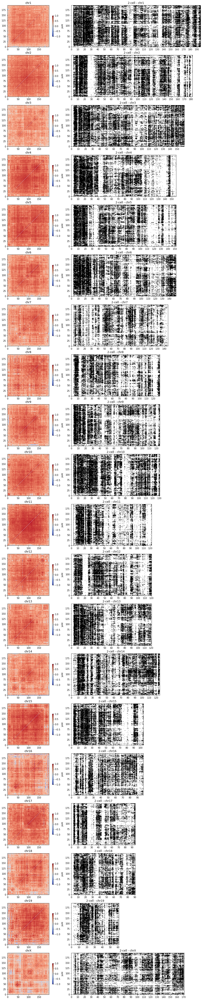

In [49]:
valid_samples = anno[(anno.cellcount == 1) & (anno.stage.isin(['2cell'])) & (anno.treatment=='no_treatment')].index.values
chroms = chrom_order[:-1]
plot_clustered_heatmaps_per_chrom(valid_samples, chroms, titlefmt = '2-cell')

### 8-cell samples

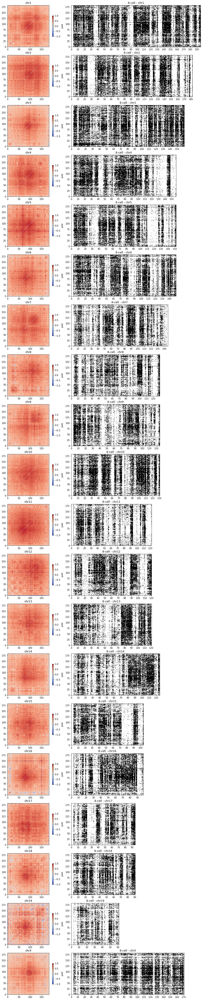

In [50]:
valid_samples = anno[(anno.cellcount == 1) & (anno.stage.isin(['8cell'])) & (anno.treatment=='no_treatment')].index.values
chroms = chrom_order[:-1]
plot_clustered_heatmaps_per_chrom(valid_samples, chroms, titlefmt = '8-cell')

### mESC samples

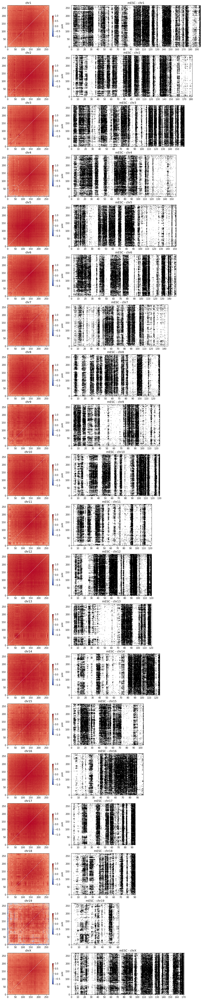

In [51]:
valid_samples = anno[(anno.cellcount == 1) & (anno.stage.isin(['mESC'])) & (anno.treatment=='no_treatment')].index.values
chroms = chrom_order[:-1]
plot_clustered_heatmaps_per_chrom(valid_samples, chroms, titlefmt = 'mESC')

### 2-cell samples - injected with Cbx7(CD)-Lap2b

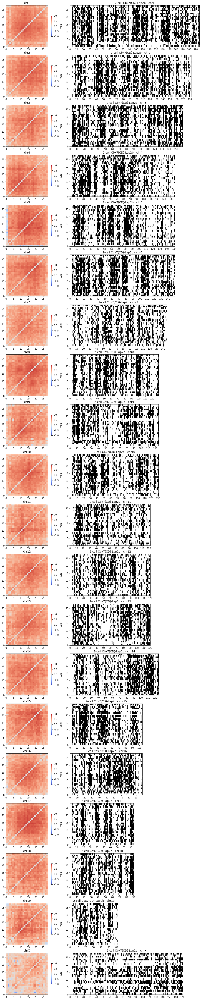

In [52]:
valid_samples = anno[(anno.cellcount == 1) & (anno.stage.isin(['2cell'])) & (anno.treatment=='Cbx7(CD)-Lap2b')].index.values
chroms = chrom_order[:-1]
plot_clustered_heatmaps_per_chrom(valid_samples, chroms, titlefmt = '2-cell Cbx7(CD)-Lap2b')